#### House Prices: Advanced Regression Techniques

This competition challenges one to predict the final price of each home. The dataset has been collected for residential homes in Ames, Iowa, with 79 explanatory variables describing (almost) every aspect of the house.
    
In this module, we try to predict the prices of the house by implementing the following algorithms:
    1. Linear Regression, Ridge regression (L2 regularization), Lasso Regression(L1 regularization)
    2. Gradient Boosting Method
    3. Neural Networks

This module has been developed with an objective of demonstrating a detailed EDA and gaining a good understanding of the dataset. A few basic visualizations have been included to demonstrate the relation between dependent and independent variables and their distribution. 

1. Loading Data
        1.1 Loading required libraries and reading datasets
        1.2 Performing basic check to get data size and structure
2. Univariate Analysis (to explore a few important variables)  
        2.1 The response variable - SalePrice
        2.2 A few important numeric predictors (based on general understanding)
3. Bivariate Analysis   
        3.1 Correlations with SalePrice
        3.2 Boxplots to understand relation between overall quality and Sale Price, and other discrete numerical variables
        3.3 Scatter plots between continous explantory and response variables.
4. Missing data handling, outlier treatment, label encoding and factorizing variables
        4.1 Completeness of the data, treating null values
        4.2 Outlier identification  and capping
        4.3 Ordinal categorical data to numeric conversion
        4.4 Converting numerical variables into factors
        4.5 Correlation plots, feature selection and label encoding
            4.5.1 Correlation plot to identify correlated variables and drop them from model
            4.5.2 Label encoding/ factorization of remaining categorical variables after dropping variables from correlation
            4.5.3 Repeated correlation checks, label encoding and dropping encoded columns based on correlation
5. Feature Engineering
6. Data preparation for modeling
        6.1 Log transformations of Skewed data (explanatory and response variables)
        6.2 Train-test split
        6.3 Scaling of feature vectors
        6.4 VIF check to identify multi-collinear variables and dropping them        
7. Modeling
        7.1 Linear Regression model
        7.2 Decision tree regressor
        7.3 Neural Networks

### Loading Data

In [1]:
#Importing required libraries
import pandas as pd
import numpy as np
import os

import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import norm
from scipy import stats
import math

from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split

from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso

from sklearn.metrics import mean_squared_error

from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
import statsmodels.api as sm
import statsmodels.formula.api as smf 

from sklearn.ensemble import GradientBoostingRegressor

os.chdir("C:\\Users\\prasanna\\Desktop\\Kaggle\\House Pricing")

In [2]:
#Reading in the datasets
train_data = pd.read_csv('train.csv')
test_data = pd.read_csv('test.csv')

    
#Performing basic check to get data size and structure   
print('Train data shape is ',train_data.shape)
print('Test data shape is ',test_data.shape, '\n')
print('Columns in the data are \n',train_data.columns.values,'\n')
print('Checking the stats for numerical columns in our data \n')
train_data.describe().T

Train data shape is  (1460, 81)
Test data shape is  (1459, 80) 

Columns in the data are 
 ['Id' 'MSSubClass' 'MSZoning' 'LotFrontage' 'LotArea' 'Street' 'Alley'
 'LotShape' 'LandContour' 'Utilities' 'LotConfig' 'LandSlope'
 'Neighborhood' 'Condition1' 'Condition2' 'BldgType' 'HouseStyle'
 'OverallQual' 'OverallCond' 'YearBuilt' 'YearRemodAdd' 'RoofStyle'
 'RoofMatl' 'Exterior1st' 'Exterior2nd' 'MasVnrType' 'MasVnrArea'
 'ExterQual' 'ExterCond' 'Foundation' 'BsmtQual' 'BsmtCond' 'BsmtExposure'
 'BsmtFinType1' 'BsmtFinSF1' 'BsmtFinType2' 'BsmtFinSF2' 'BsmtUnfSF'
 'TotalBsmtSF' 'Heating' 'HeatingQC' 'CentralAir' 'Electrical' '1stFlrSF'
 '2ndFlrSF' 'LowQualFinSF' 'GrLivArea' 'BsmtFullBath' 'BsmtHalfBath'
 'FullBath' 'HalfBath' 'BedroomAbvGr' 'KitchenAbvGr' 'KitchenQual'
 'TotRmsAbvGrd' 'Functional' 'Fireplaces' 'FireplaceQu' 'GarageType'
 'GarageYrBlt' 'GarageFinish' 'GarageCars' 'GarageArea' 'GarageQual'
 'GarageCond' 'PavedDrive' 'WoodDeckSF' 'OpenPorchSF' 'EnclosedPorch'
 '3SsnPorch' '

,count,mean,std,min,25%,50%,75%,max
Id,1460.0,730.500000,421.610009,1.0,365.75,730.5,1095.25,1460.0
MSSubClass,1460.0,56.897260,42.300571,20.0,20.00,50.0,70.00,190.0
LotFrontage,1201.0,70.049958,24.284752,21.0,59.00,69.0,80.00,313.0
LotArea,1460.0,10516.828082,9981.264932,1300.0,7553.50,9478.5,11601.50,215245.0
OverallQual,1460.0,6.099315,1.382997,1.0,5.00,6.0,7.00,10.0
OverallCond,1460.0,5.575342,1.112799,1.0,5.00,5.0,6.00,9.0
YearBuilt,1460.0,1971.267808,30.202904,1872.0,1954.00,1973.0,2000.00,2010.0
YearRemodAdd,1460.0,1984.865753,20.645407,1950.0,1967.00,1994.0,2004.00,2010.0
MasVnrArea,1452.0,103.685262,181.066207,0.0,0.00,0.0,166.00,1600.0
BsmtFinSF1,1460.0,443.639726,456.098091,0.0,0.00,383.5,712.25,5644.0


##### Takeaway: 
* The response variable which must be predicted in this exercise is the 'SalePrice' variable, and the rest are the explanatory variables.

* Based on the column names and data dictionary provided for reference, we see that our data contains several ordinal categorical metrics (such as GarageCond, GarageQual etc) which are indicative of ratings based on quality and condition. These ordinal categorical variables can be converted into numeric variables before feeding into the model to capture their ordinal information effectively.

* We observe that all numerical values, particularly pertaining to area and price, are all greater than 0, indicating there are no negative values, which is a good sign.

### Univariate Analysis

Univariate analysis is performed on one variable at a time, to check its distribution and check possibilities for outliers. This is done to get basic sense of variables involved and their range.

Skewness of SalePrice is 1.8828757597682129 

Kurtosis of SalePrice is 6.536281860064529 



C:\Users\prasanna\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


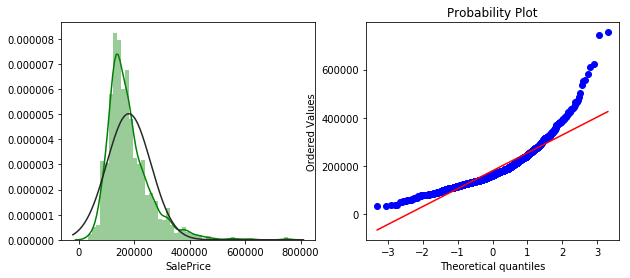

In [3]:
#The response variable - SalePrice
print('Skewness of SalePrice is', train_data['SalePrice'].skew(),'\n')
print('Kurtosis of SalePrice is', train_data['SalePrice'].kurt(),'\n')

plt.figure(figsize=(10, 4))
plt.subplot(1,2,1)
sns.distplot(train_data['SalePrice'], color='g', fit = norm)
plt.subplot(1,2,2)
res = stats.probplot(train_data['SalePrice'], plot=plt)

##### Takeaway
We observe that the SalePrice variable has a right skewed distribution, which indicates that a few houses are expensive. We may have to transform it to a normal distribution if we wish to run linear regression technique because it will satify required assumptions of linear regression

Some important independent variables (based on general understanding are listed as below)
 * OverallQual
 * GrLivArea
 * GarageArea
 * TotalBsmtSF
 * Fullbath
 * TotRmsAbvGrd
 * YearBuilt
 * LotArea

We shall look at the distribution of each of these variables individually 

C:\Users\prasanna\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Users\prasanna\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Users\prasanna\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Users\prasanna\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Users\prasanna\Anaconda3\lib\site-packages\matplotlib

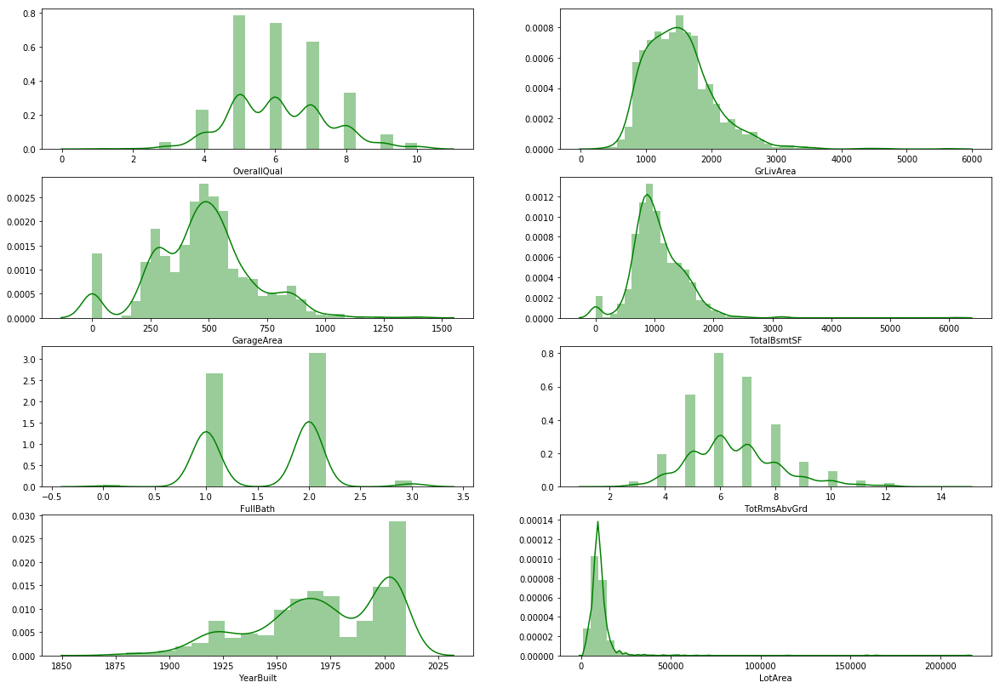

In [4]:
# Checking the distribution of a few independent important variables
plt.figure(figsize=(20, 14))
col_subplot_dict = {1:'OverallQual',2:'GrLivArea',3:'GarageArea',4:'TotalBsmtSF',5:'FullBath',6:'TotRmsAbvGrd', 7: 'YearBuilt',8:'LotArea'}
for key in col_subplot_dict: 
    plt.subplot(4,2,key)
    sns.distplot(train_data[col_subplot_dict[key]], color='g')

##### Takeaway
* We observe that some of the variables (understandably) have discrete values and area related variables have continous values.
* From the density plots above we can observe that not all variables have a normal distribution. Variables like TotalBsmtSF and GrLivArea have a skewed distribution.
* We may have to transform them to a normal distribution if we wish to run linear regression technique because it will satify required assumptions of linear regression 

### Bivariate Analysis

Bivariate analysis is used to understand how the explanatory variables are related to each other and related with the response variable. In the scope of our problem the response/ predictor variable is 'SalePrice' and the other variables are explanatory variables. 

First we look at correlation plot to understand which numerical variables have the highest correlation with our response variable. Then we look at pairwise plots to understand how these important numerical variables are related with each other and with response variable using box plots and scatter plots.

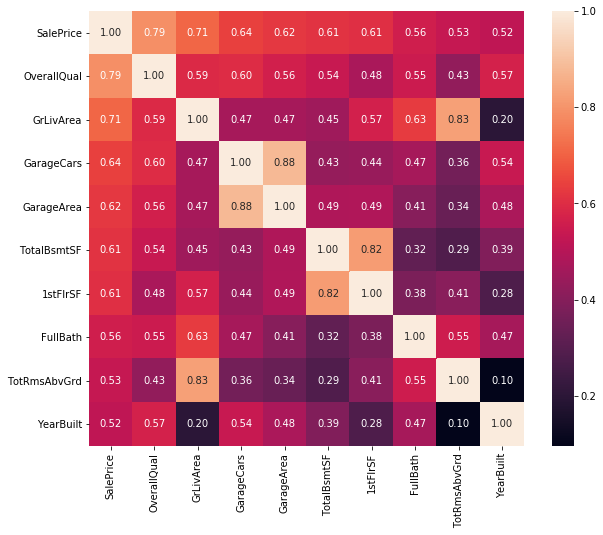

In [5]:
# Correlation plot
k = 10 #number of variables for heatmap
largest_corr_cols = train_data.corr().nlargest(k, 'SalePrice')['SalePrice'].index
cm = np.corrcoef(train_data[largest_corr_cols].values.T)
plt.figure(figsize=(10,8))
sns.heatmap(cm, cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 10}, yticklabels=largest_corr_cols.values, xticklabels=largest_corr_cols.values)
plt.show()

##### Takeaway 
* From the correlation plot we observe that OverallQual has highest correlation with SalePrice. As it is a discrete value, we use boxplots to capture its distribution wrt SalePrice.
* The boxplots for other variables - GarageCars, FullBath, TotRmsAbvGrd have also been plotted below

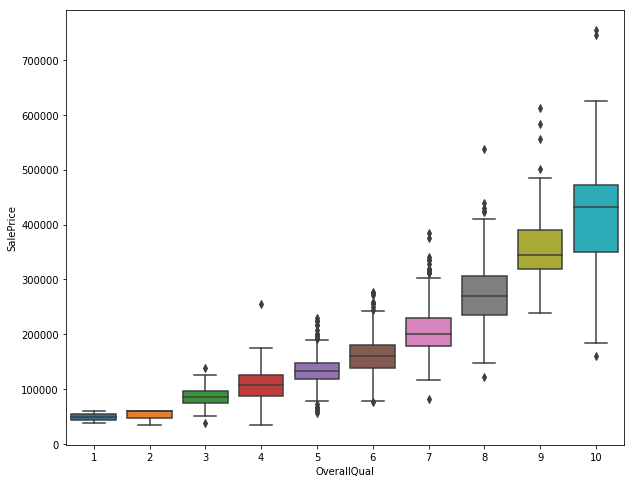

In [6]:
#Overall Quality vs Sales Price Box Plot
plt.figure(figsize= (10,8))
data = pd.concat([train_data['SalePrice'], train_data['OverallQual']], axis=1)
fig = sns.boxplot(x='OverallQual', y="SalePrice", data=data)

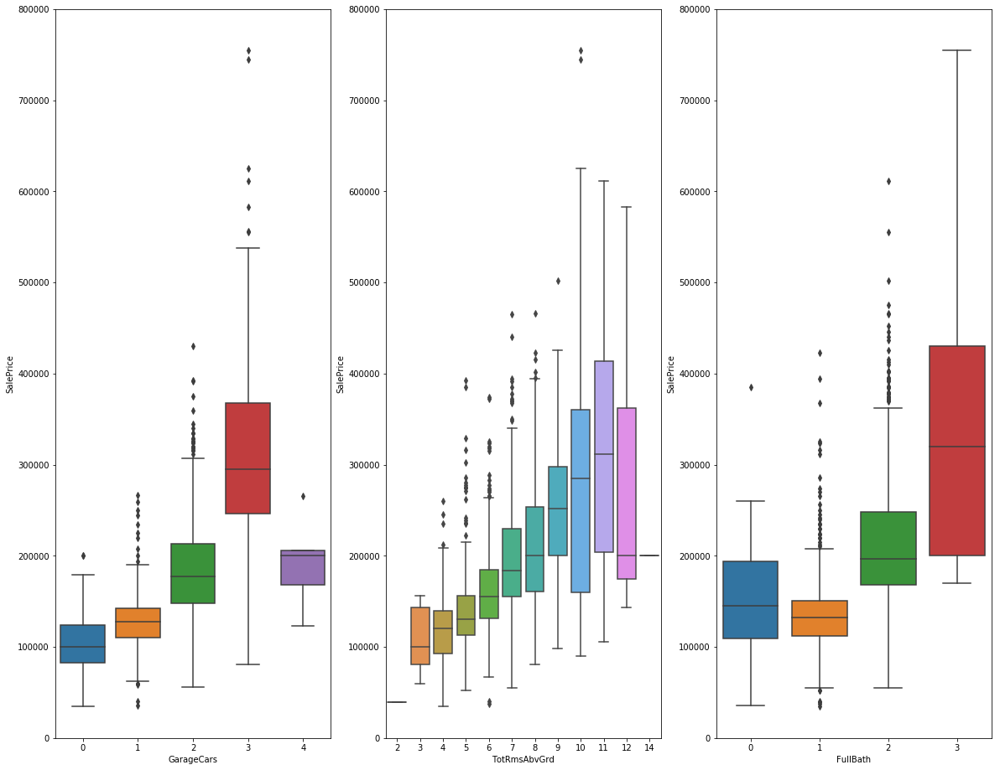

In [7]:
#Full Bath, Total Rooms Above Ground, Garage Cars vs Sales Price Box Plots
cat_dict_boxplot = {1:'GarageCars',2:'TotRmsAbvGrd',3:'FullBath'}
plt.figure(figsize=(20,16))
for var in cat_dict_boxplot:
    data = pd.concat([train_data['SalePrice'], train_data[cat_dict_boxplot[var]]], axis=1)
    plt.subplot(1,3,var)
    fig = sns.boxplot(x=cat_dict_boxplot[var], y="SalePrice", data=data)
    fig.axis(ymin = 0, ymax = 800000)

##### Takeaway
* We see that as the car capacity of garages, total rooms and number of full bathrooms in a house increases, the sales price also increases. 
* However, there is an anomaly observed in a couple of these factors where the values are too high, but the sales price is very low. 
* One possible explanation is that the data points pertaining to this anomaly comes from houses that are in rural or agricultural neighbourhood, which has lesser preference due to a possible absence of its proximity with public services.

<Figure size 432x288 with 0 Axes>

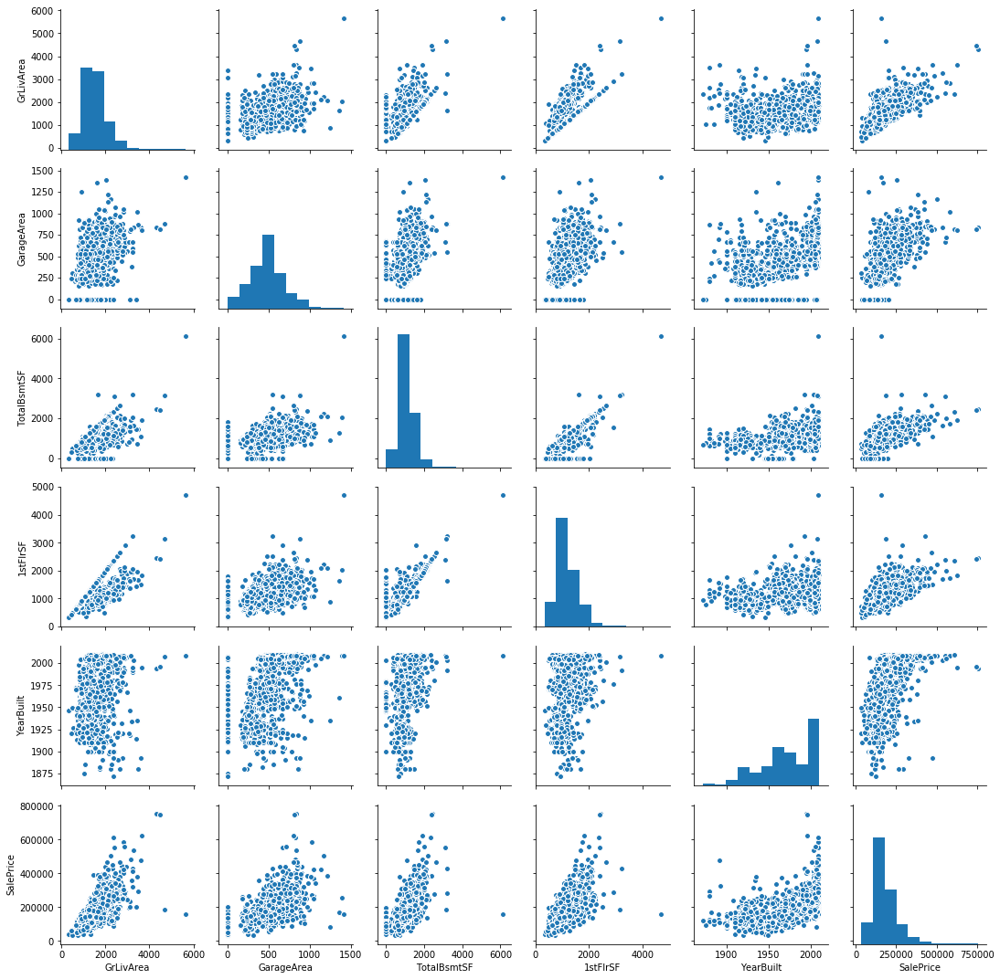

In [8]:
# Scatter plots
plt.figure()
pairwise_cols = ['GrLivArea','GarageArea','TotalBsmtSF','1stFlrSF','YearBuilt','SalePrice']
sns.pairplot(train_data[pairwise_cols])
plt.show()

##### Takeaway
From the scatter plots, we can see that the following variables are strongly linearly correlated with the response variable:

    1) TotalBsmtSF
    2) GrLivArea
    3) 1stFlrSF
  
Further more, the variable YearBuilt has a sort of exponential correlation with SalePrice. This indicates that the buildings built in recent years have a higher Sale Price.

We also observe that some explanatory variables also have strong correlation:

    1) TotalBsmtSF vs 1stFlrSF
    2) 1stFlrSF vs GrLivArea
    3) GrLivArea vs TotalBsmtSF

These need to be addressed and possibly dropped because they may result in over-fitting in our model. We address multi-collinearlity by checking for VIF. 

In [9]:
train_data_last = train_data.tail(1)['Id'].values[0]
test_data_first = test_data.head(1)['Id'].values[0]

#Separating X data from y data
train_data_y = train_data['SalePrice']
#Dropping irrelevent columns
test_data_x = test_data.drop(['Id'], axis = 1)
train_data_x = train_data.drop(['Id','SalePrice'], axis = 1)

#Combining train and test datasets because some operations must be performed on both train and test data of X. 
#Outliers are treated separately, but all the others such as handling missing values, label encoding and factorization can be done simultaneously
features = pd.concat([train_data_x, test_data_x]).reset_index(drop=True) 

### Missing data handling, outlier treatment, label encoding and factorizing variables

In [10]:
#Null values treatment
# Lot Frontage
neighborhood_lotfrontage_mean = features.groupby(['Neighborhood']).agg({'LotFrontage': np.mean}).reset_index()
neighborhood_lotfrontage_mean.columns = ['Neighborhood','meanLotFrontage']
features = features.merge(neighborhood_lotfrontage_mean, on = 'Neighborhood', how = 'left')
features['LotFrontage'] = np.where(features['LotFrontage'].isnull(), features['meanLotFrontage'],features['LotFrontage'])
features.drop(['meanLotFrontage'], axis = 1, inplace = True)

# GarageFinish, GarageType, GarageQual, GarageCond
for col in ["GarageFinish", "GarageType", "GarageQual", "GarageCond",\
            'BsmtExposure', 'BsmtFinType2', 'BsmtFinType1', 'BsmtQual', 'BsmtCond',\
            'FireplaceQu','PoolQC','Fence','MiscFeature','KitchenQual']:
    features[col].fillna('Not Available', inplace = True)    
    
#Electrical,MasVnrType
for column in ['Electrical','MasVnrType','MSZoning','Functional','Utilities','SaleType','Exterior1st','Exterior2nd',\
               "BsmtFullBath", "BsmtHalfBath",'GarageCars']:
    features[column].fillna(features[column].mode()[0], inplace=True)

#Additional variables with nulls:
for col_num in ['TotalBsmtSF',"BsmtFinSF1",'GarageArea', 'BsmtFinSF2','BsmtUnfSF']:
    features[col_num].fillna(np.mean(features[col_num]), inplace = True)    
    
#Garage year built
features['GarageYrBlt'].fillna(0, inplace = True)

# MasVnrArea
features['MasVnrArea'] = np.where(features['MasVnrArea'].isnull(), features.loc[:,'MasVnrArea'].mode(),features.loc[:,'MasVnrArea'])

features['Alley'].fillna('No Alley', inplace = True)
    
features.shape
features.isnull().sum().sort_values(ascending = False)

SaleCondition    0
Foundation       0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
BsmtQual         0
YearRemodAdd     0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtFinSF2       0
BsmtUnfSF        0
RoofStyle        0
YearBuilt        0
Heating          0
Utilities        0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
Alley            0
LotShape         0
LandContour      0
LotConfig        0
                ..
ScreenPorch      0
GarageFinish     0
PoolArea         0
PoolQC           0
Fence            0
MiscFeature      0
MiscVal          0
MoSold           0
YrSold           0
GarageCars       0
GarageYrBlt      0
CentralAir       0
FullBath         0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
HalfBath         0
GarageType  

In [11]:
#Outlier identification and capping, points that are beyong 3 standard deviations away from the mean (i.e. 99.7% and above are capped)

# mean +- 3sigma
num_cols_for_outlier_cap = ['LotFrontage', 'LotArea','MasVnrArea','GrLivArea','TotalBsmtSF',
                            'GarageArea','WoodDeckSF', 'OpenPorchSF','PoolArea', 'MiscVal']

# function to calculate outlier of a variable
def outlier_points(x):
    mu = np.average(x)
    sigma = np.std(x)
    LL = mu - 3*sigma # Lower limit 
    UL = mu + 3*sigma # Upper limit
    out = [1 if (a >= UL) | (a <= LL) else 0 for a in x]
    return(out)

# check #outliers in each variable
print(features[num_cols_for_outlier_cap].apply(outlier_points).sum())

# Function to Replace outlier with LL / UL

def out_impute(x):
    mu = np.average(x)
    sigma = np.std(x)
    LL = mu - 3*sigma # Lower limit 
    UL = mu + 3*sigma # Upper limit
    xnew= np.where(x<=LL,LL,(np.where(x>=UL,UL,x)))
    return(xnew)

features[num_cols_for_outlier_cap] = features[num_cols_for_outlier_cap].apply(out_impute) # Create new data with inputed values


LotFrontage    25
LotArea        29
MasVnrArea     63
GrLivArea      25
TotalBsmtSF    21
GarageArea     17
WoodDeckSF     42
OpenPorchSF    51
PoolArea       13
MiscVal        19
dtype: int64


In [12]:
data_reqd_final = features.copy() 

In [13]:
#Identifying ordinal categorical variables to numerical variables (mostly the variables that pertain to ratings are converted here)
ord_cat_to_num_col_1 = ['ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond','BsmtExposure','HeatingQC', 'KitchenQual','FireplaceQu',
                        'PoolQC','GarageQual','GarageCond']
ord_to_num_dict_1 = {'Ex':6,'Gd':5,'TA':4,'Av':4,'Fa':3,'Mn':3,'Po':2,'No':2,'Not Available':1,}

ord_cat_to_num_col_2 = ['BsmtFinType1', 'BsmtFinType2']
ord_to_num_dict_2 = {'GLQ':7,'ALQ':6,'BLQ':5,'Rec':4,'LwQ':3,'Unf':2,'Not Available':1}

landslope_dict = {"Sev" : 1, "Mod" : 2, "Gtl" : 3}
utilities_dict = {"ELO" : 1, "NoSeWa" : 2, "NoSewr" : 3, "AllPub" : 4}
street_dict = {"Grvl" : 1, "Pave" : 2}

#Converting ordinal categorical variables to numerical variables (mostly the variables that pertain to ratings are converted here)
for col_name in ord_cat_to_num_col_1:
    data_reqd_final[col_name] = data_reqd_final[col_name].map(ord_to_num_dict_1)
for col_name in ord_cat_to_num_col_2:
    data_reqd_final[col_name] = data_reqd_final[col_name].map(ord_to_num_dict_2)

data_reqd_final['LandSlope'] = data_reqd_final['LandSlope'].map(landslope_dict)
data_reqd_final['Utilities'] = data_reqd_final['Utilities'].map(utilities_dict)
data_reqd_final['Street'] = data_reqd_final['Street'].map(street_dict)

#converting a numerical variable to categorical
data_reqd_final['MSSubClass'] = data_reqd_final['MSSubClass'].astype(str)

#### Feature selection based on correlation values

* First round of correlation on raw data
    - This data constitutes of training data only, where all the ordinal categorical variables have been converted into numeric variables, a numeric variable 'MSSubClass' has been converted into categorical variables, null values have been treated and outliers have been capped.The Following variables have been converted from categorical to numerical:
        - ExterQual
        - ExterCond
        - BsmtQual
        - BsmtCond 
        - BsmtExposure
        - HeatingQC
        - KitchenQual
        - FireplaceQu
        - PoolQC
        - GarageQual
        - GarageCond
    - The steps mentioned below try to identify correlated explanatory variables. Variables with correlation coefficient greater than 0.6 may be considered for removal based on their importance in general sense.
    - After removing a few correlated variables, one hot encoding of categorical columns is performed and correlation check is run again

In [14]:
#Getting a correlation dataframe:
def get_corr_pairs_dataframe(dataset,lower_threshold):
    corr_values = dataset.corr().abs()
    corr_df = pd.DataFrame(corr_values.unstack()).reset_index()
    #Sorting correlated pairs in descending order of correlation coefficients
    corr_df.sort_values(0, ascending = False, inplace= True)
    #Filtering out only pairs which have correlation greater than 0.6(Number can change) and not 1.0
    corr_df_reqd = corr_df[(corr_df[0] < 1.0) & (corr_df[0] > lower_threshold)].reset_index(drop = True)
    return corr_df_reqd

In [15]:
#Correlation plot and getting pairs with highest correlation
corr = data_reqd_final.corr()
# Heatmap of correlation plot
corr.style.background_gradient(cmap='coolwarm')

In [16]:
#Checking for pairs with highest correlations (greater than 0.65): 
# train_data_reqd_final
corr_df_reqd_1 = get_corr_pairs_dataframe(data_reqd_final, 0.65)
print(corr_df_reqd_1.shape)
corr_df_reqd_1

(30, 3)


,level_0,level_1,0
0,GarageYrBlt,GarageCond,0.949602
1,GarageCond,GarageYrBlt,0.949602
2,GarageQual,GarageCond,0.946656
3,GarageCond,GarageQual,0.946656
4,GarageQual,GarageYrBlt,0.944441
5,GarageYrBlt,GarageQual,0.944441
6,GarageCars,GarageArea,0.893919
7,GarageArea,GarageCars,0.893919
8,FireplaceQu,Fireplaces,0.861735
9,Fireplaces,FireplaceQu,0.861735


In [17]:
#First round of removing irrelvant columns after correlation
data_reqd_x = data_reqd_final.drop(['GarageArea','GarageQual','GarageYrBlt','PoolQC','Fireplaces','TotRmsAbvGrd','1stFlrSF','2ndFlrSF','ExterQual','KitchenQual','BsmtFinSF2','BsmtFinSF1','BsmtQual'], axis = 1)
#Cross checking if any additional correlated pairs are left after removing correlations. 
corr_df_after_column_drop = get_corr_pairs_dataframe(data_reqd_x, 0)

##### Takeaway
The following numerical columns have been removed due to their correlation with other columns. Care has been taken to retain columns that have high correlation with the response variable:
 * Garage Area (with Garage Cars, that has higher correlation with Sales Price)
 * GarageQual 
 * GarageYrBlt (with YearBuilt, that has higher correlation with Sales Price)
 * PoolQC
 * Fireplaces
 * TotRmaAbvGrd (with GrLivArea, that has higher correlation with Sales Price)
 * 1stFlrSF (with TotalBsmtSF, that has higher correlation with Sales Price)
 * 2ndFlrSF (with GrLivArea, that has higher correlation with Sales Price)
 * ExterQual (with OverallQual, that has higher correlation with Sales Price)
 * KitchenQual (with OverallQual, that has higher correlation with Sales Price)
 * BsmtFinSF2
 * BsmtFinSF1
 * BsmtQual

In [18]:
#Create a copy of original data with dropped columns, the copy will be used for one-hot-encoding
data_encoded_x = data_reqd_x.copy()

One hot encoding of nominal categorical variables into numerical columns for linear regression analysis

In [19]:
#One hot encoding of nominal categorical variables into numerical variables
one_hot_vars = ['MSSubClass', 'MSZoning','Alley',\
       'LotShape', 'LandContour', 'LotConfig',\
       'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',\
       'RoofStyle','RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', \
       'Foundation', 'Heating', 'CentralAir','MiscFeature',\
       'Electrical', 'Functional', 'GarageType', 'GarageFinish', \
       'PavedDrive', 'Fence', 'SaleType','SaleCondition']
encoded_cols_df = pd.get_dummies(data_encoded_x[one_hot_vars],drop_first=True)
print(data_encoded_x.shape)
data_x_final = pd.concat([data_encoded_x,encoded_cols_df], axis = 1)
data_x_final.drop(one_hot_vars, axis =1, inplace = True)
print(data_x_final.shape)

(2919, 66)
(2919, 216)


* Second round of correlation on raw data
    - This data constitutes of training data only, where some of the (now) numerical variables have been dropped based on correlation with other variables, and the remaining categorical variables have been converted into dummy values. 
    - In this round of correlation check we, are trying to see if any of the converted dummy variables have absolutely high colliearity with the SalePrice and amongst themselves. Using this, we can completely drop a few columns (created from dummification of same variable or other variables) and keep the rest to reduce the size of our feature set. 

In [20]:
#Second round of correlation after one-hot encoding to check if any variables need to be dropped. 
#Correlation plot and getting pairs with highest correlation
corr = data_x_final.corr()
# Heatmap of correlation plot
corr.style.background_gradient(cmap='coolwarm')

In [21]:
#Splitting data into train and test X data because we want to check if the encoded columns are having any correlation with Y. 
#And we will remove those that have minimal corr with y.
train_data_x_final = data_x_final.iloc[:train_data_last,]
test_data_x_final = data_x_final.iloc[test_data_first:,]

In [22]:
#Checking for pairs with highest correlations:
data_x_y_final = pd.concat([train_data_x_final,train_data_y], axis = 1)
corr_df_reqd_2 = get_corr_pairs_dataframe(data_x_y_final, 0.65)
print(corr_df_reqd_2.shape)
corr_df_reqd_2

(84, 3)


,level_0,level_1,0
0,SaleCondition_Partial,SaleType_New,0.986819
1,SaleType_New,SaleCondition_Partial,0.986819
2,MSSubClass_190,BldgType_2fmCon,0.983395
3,BldgType_2fmCon,MSSubClass_190,0.983395
4,Exterior2nd_VinylSd,Exterior1st_VinylSd,0.977525
5,Exterior1st_VinylSd,Exterior2nd_VinylSd,0.977525
6,Exterior2nd_CmentBd,Exterior1st_CemntBd,0.974171
7,Exterior1st_CemntBd,Exterior2nd_CmentBd,0.974171
8,Exterior2nd_MetalSd,Exterior1st_MetalSd,0.973065
9,Exterior1st_MetalSd,Exterior2nd_MetalSd,0.973065


##### Takeaway
* Dummified numerical variable sets to be drop based on correlation coef are listed as below. These are dropped from the output of correlation phase 1 itself (the data before one-hot encoding) so that they are not even encoded in the first place. The above step of converting categorical to numerical is just a trial step to check if there is any correlation after dummification. 
* Hence we drop the variables from original data itself and perform dummification on remaining categorical variables. 
* Dropped categorical variables: 
    - MasVnrArea(With MasVnrType)
    - GarageCond(With GarageType and GarageQual)
    - MSSubClass(With House style)
    - SaleType(With SaleCond)
    - Exterior2nd(With Exterior1st)
    - MSZoning(With neighbourhood)
    - MiscFeature

In [23]:
#One hot encoding of nominal categorical variables into numerical variables
one_hot_vars = [ 'Alley',\
       'LotShape', 'LandContour', 'LotConfig', \
       'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',\
       'RoofStyle','RoofMatl', 'Exterior1st',  'MasVnrType', \
       'Foundation', 'Heating', 'CentralAir',\
       'Electrical', 'Functional', 'GarageType', 'GarageFinish', \
       'PavedDrive', 'Fence', 'SaleCondition']
encoded_cols_df = pd.get_dummies(data_encoded_x[one_hot_vars],drop_first=True)
print(data_encoded_x.shape)
data_x_final = pd.concat([data_encoded_x,encoded_cols_df], axis = 1)
data_x_final.drop(one_hot_vars, axis =1, inplace = True)
data_x_final.drop(['MasVnrArea','GarageCond','MSSubClass','MSZoning','Exterior2nd','SaleType','MiscFeature'], axis = 1,inplace = True)
print(data_x_final.shape)

(2919, 66)
(2919, 168)


* Third round of correlation on raw data
    - This data constitutes of training data only, where some of the numerical and categorical variables and remaining categorical have been encoded.
    - We now check if there is any correlation between all the independent variables (both dummified and otherwise).
    - We drop correlated variable and get our final data ready for modeling. Based on modeling requirements, we may again have to check for multi-collinearity in our data

In [24]:
#Correlation plot and getting pairs with highest correlation
corr = data_x_final.corr()
# Heatmap of correlation plot
corr.style.background_gradient(cmap='coolwarm')

In [25]:
data_x_final_copy  = data_x_final.copy()

In [26]:
#Dropping the other correlated variables after one hot encoding
data_x_final_copy.drop(['RoofStyle_Gable','RoofStyle_Shed','MasVnrType_None','Foundation_PConc','Foundation_Slab',\
                         'KitchenAbvGr','Heating_GasA','GarageType_Detchd','GarageType_Not Available','Fence_Not Available',\
                         'Alley_No Alley','HouseStyle_1Story','SaleCondition_Partial','RoofMatl_CompShg'], axis = 1, inplace = True)
print(data_x_final_copy.shape)
corr_df_reqd_3 = get_corr_pairs_dataframe(data_x_final_copy, 0)
print(corr_df_reqd_3.shape)
corr_df_reqd_3

(2919, 154)
(23562, 3)


,level_0,level_1,0
0,Condition2_Feedr,Condition2_Norm,0.656352
1,Condition2_Norm,Condition2_Feedr,0.656352
2,GrLivArea,FullBath,0.640593
3,FullBath,GrLivArea,0.640593
4,HouseStyle_2Story,HalfBath,0.619895
5,HalfBath,HouseStyle_2Story,0.619895
6,LandContour_HLS,LandContour_Lvl,0.615216
7,LandContour_Lvl,LandContour_HLS,0.615216
8,YearBuilt,YearRemodAdd,0.612235
9,YearRemodAdd,YearBuilt,0.612235


In [27]:
data_final = data_x_final_copy.copy()
data_final.shape

(2919, 154)

##### Takeaway
All ordinal-to-numeric conversions have been made, null values have been treated,outliers have been capped , categorical variables have been dummified, and correlated features have been removed.  

### Feature Engineering

Feature engineering is performed to reduce the feature-set and engineer new features by transforming existing features or getting combining two or more features. 
* The house pricing data consists of several quality and condition related discrete variables. These features can be clubbed together to give a single score that captures all these values effectively. 
* Another example of feature engineering is creation of a Remodeled_Flag which can be derived from YearRemodAdd variable which indicates whether the house was remodeled or not

Such feature engineering may create a trade-off between model computation speed vs accuracy, and hence this step must be taken with caution.

In [28]:
data_feature_engineered = data_final.copy()  

In [29]:
# Creating a remodeled flag to indicate if the building was remodeled or not
data_feature_engineered['Remodeled_Flag'] =  np.where(data_final['YearBuilt'] == data_final['YearRemodAdd'], 1,0)
data_feature_engineered.drop(['YearRemodAdd'], axis = 1, inplace = True)

# Club quality related columns into one single extrapoints column (Fireplace, Heating.. ). Although look at corr of columns being clubbed with sale price. 
# Leave behind extrememly important variables as they are. 

### Data Preparation for Modeling

In [30]:
# Addressing Skewness using log transformation methods
# Continous area related variables:
var_cont = ['LotFrontage', 'LotArea','TotalBsmtSF', 'GrLivArea',
       'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch',
       '3SsnPorch', 'ScreenPorch', 'PoolArea']       
skewness_df = pd.DataFrame(data_feature_engineered[var_cont].skew()).reset_index()
skewness_df.columns = ['Variable name','Skewness']
skewness_df.sort_values('Skewness', ascending = False)
# Cases with Skewness value greater than 1 need to be noralized using log transformations. The variables GrLivArea and Sale Price are most important ones to transform.
skewed_cols = skewness_df[skewness_df['Skewness'] > 1]['Variable name']
skewed_cols = list(skewed_cols.values)

#We use the numpy fuction log1p which applies log(1+x) to all elements of the column
data_feature_engineered[skewed_cols]= data_feature_engineered[skewed_cols].apply(lambda x: np.log1p(x))
train_data_y_non_log = train_data_y.copy()
train_data_y = np.log1p(train_data_y)

In [31]:
#Splitting data into train and test X data.
train_feature_engineered = data_feature_engineered.iloc[:train_data_last,]
test_feature_engineered = data_feature_engineered.iloc[test_data_first:,]

In [32]:
#Train test split of data
X_train,X_val,y_train,y_val = train_test_split(train_feature_engineered,train_data_y,test_size=0.20, random_state=1)
print(X_train.shape)
print(y_val.shape)

(1168, 154)
(292,)


In [33]:
# Min - max scaling of data for bringing variables of different range into the 0-1 interval
# Data Normalization 
X_train_normalized = X_train.copy()
X_val_normalized = X_val.copy()
y_train_normalized = y_train.copy()
y_val_normalized = y_val.copy()
X_test_normalized = test_feature_engineered.copy()

scaler_x = MinMaxScaler() 
scaled_values_x_train = scaler_x.fit_transform(X_train_normalized)
scaled_values_x_val = scaler_x.transform(X_val_normalized)
scaled_values_x_test = scaler_x.transform(X_test_normalized)

                                                
X_train_normalized.loc[:,:] = scaled_values_x_train
X_val_normalized.loc[:,:] = scaled_values_x_val
X_test_normalized.loc[:,:] = scaled_values_x_test


#scaler_y = MinMaxScaler() 
#scaled_values_y_train = scaler_y.fit_transform(y_train_normalized[:,np.newaxis])
#scaled_values_y_val = scaler_y.transform(y_val_normalized[:,np.newaxis])

#y_train_normalized = scaled_values_y_train
#y_val_normalized = scaled_values_y_val

##### Takeaway
A high skewness was observed in several independent variables. This was expected because there are likely to be very few houses with extremely high prices. Similarly, there might be very few houses with extremely large living area, etc. It is essential to transform them using log-transformations to ensure that the model is not affected too much by such exceptional cases. 

We have also normalized the x variables to a scale of 0 to 1 to contain the beta values that are obtained. One must remember that all the above mentioned transformations must be done for test set as well before we try to predict sales price for test cases. 

In [34]:
#VIF determination to drop multi-collinear variables
def vif_det(X_normalized):
    X = add_constant(X_normalized)
    vif_dataframe = pd.Series([variance_inflation_factor(X.values, i) for i in range(X.shape[1])], 
              index=X.columns)
    return print(vif_dataframe.sort_values(ascending = False))
    # Several variables related to RoofMatl and Exterior 1st have a high multi-collinearlity with other variables. We will try to drop them. At the beginning of our analysis only.
vif_det(X_train_normalized)

C:\Users\prasanna\Anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1543: RuntimeWarning: invalid value encountered in double_scalars
  return 1 - self.ssr/self.centered_tss


const                   3723.875499
Exterior1st_VinylSd       29.242024
Neighborhood_NAmes        22.077068
Exterior1st_HdBoard       15.960367
Exterior1st_MetalSd       15.788502
Exterior1st_Wd Sdng       14.658261
Neighborhood_CollgCr      14.493050
Neighborhood_OldTown      13.626017
Functional_Typ            11.757789
YearBuilt                 11.401074
Neighborhood_Edwards      10.927438
Exterior1st_Plywood       10.028063
Condition2_Norm            9.542645
Neighborhood_Somerst       8.939234
Neighborhood_NWAmes        8.887645
Neighborhood_Gilbert       8.720419
GrLivArea                  8.556008
Neighborhood_Sawyer        8.430990
Neighborhood_NridgHt       7.960277
Neighborhood_BrkSide       7.748692
Neighborhood_Crawfor       6.970546
TotalBsmtSF                6.958151
Exterior1st_CemntBd        6.575692
Neighborhood_SawyerW       6.334605
Neighborhood_Mitchel       5.320989
Functional_Min2            5.296584
Condition1_Norm            5.212836
Neighborhood_IDOTRR        5

In [35]:
# The Exterior1st and Neighbourhood columns seem to be a cause of correlation in the data, hence we drop all columns pertaining to this entirely:
#Dropping all Exterior1st columns:
#From train
X_train_normalized_no_ext1 = X_train_normalized[X_train_normalized.columns.drop(list(X_train_normalized.filter(regex='Exterior1st_')))]
print(X_train_normalized_no_ext1.shape)

#From val
X_val_normalized_no_ext1 = X_val_normalized[X_val_normalized.columns.drop(list(X_val_normalized.filter(regex='Exterior1st_')))]

#From test
X_test_normalized_no_ext1 = X_test_normalized[X_test_normalized.columns.drop(list(X_test_normalized.filter(regex='Exterior1st_')))]

#Dropping all Neighbourhood columns:
#From train
X_train_normalized_final = X_train_normalized_no_ext1[X_train_normalized_no_ext1.columns.drop(list(X_train_normalized_no_ext1.filter(regex='Neighborhood_')))]
print(X_train_normalized_final.shape)

#From val
X_val_normalized_final = X_val_normalized_no_ext1[X_val_normalized_no_ext1.columns.drop(list(X_val_normalized_no_ext1.filter(regex='Neighborhood_')))]

#From test
X_test_normalized_final = X_test_normalized_no_ext1[X_test_normalized_no_ext1.columns.drop(list(X_test_normalized_no_ext1.filter(regex='Neighborhood_')))]

(1168, 140)
(1168, 116)


##### Takeaway
Although there are several variables that exhitibit multi-collinearity, we have dropped two sets of variables i.e. Exterior1st and Neighbourhood variables which generally seem to have highest VIF values. After dropping these variables, there are still a few variables that have VIF between 5 and 10. We have retained them for our analysis because these variables also have highest correlation with the predictor variable 'Sales Price'

The purpose of illustrating VIF is purely demonstrative, to indicate how variables can be dropped. We can later on compare the impact on R squared value by dropping these variables, but we shall perform that exercise in some other project. 

Since we have over 100 variables, we can also use dimensionality reduction techniques to club a few of these variables. We can also explore feature engineering techniques to combine them. For now, we will proceed with the dataset generated above.

In [36]:
# In case we want to retain the neighbourhood data columns
#X_train_normalized_final = X_train_normalized_no_ext1.copy()
#X_val_normalized_final = X_val_normalized_no_ext1.copy()

### Modeling

#### Linear Regression

In [45]:
# Linear Regression
reg_mod = LinearRegression(fit_intercept = False)
reg_mod.fit(X_train_normalized_final,y_train_normalized)
y_pred_reg = reg_mod.predict(X_val_normalized_final)
print('RMSE for Linear Regression for training set is: ',mean_squared_error(y_train_normalized,reg_mod.predict(X_train_normalized_final)))
print('RMSE for Linear Regression for validation set is: ',mean_squared_error(y_val_normalized,y_pred_reg))
y_test_reg_log = reg_mod.predict(X_test_normalized_final)
y_test_reg = [math.exp(x)-1 for x in y_test_reg_log]

RMSE for Linear Regression for training set is:  0.04359218937696451
RMSE for Linear Regression for validation set is:  0.06585039586400414


In [48]:
#Ridge Regression
ridge_mod = Ridge(alpha = 0.1) # higher the alpha value, more restriction on the coefficients; low alpha > more generalization, coefficients are barely
# restricted and in this case linear and ridge regression resembles
ridge_mod.fit(X_train_normalized_final,y_train_normalized)
y_pred_ridge = ridge_mod.predict(X_val_normalized_final)
print('RMSE for Ridge Regression for training set is: ',mean_squared_error(y_train_normalized,ridge_mod.predict(X_train_normalized_final)))
print('RMSE for Ridge Regression for validation set is: ',mean_squared_error(y_val_normalized,y_pred_ridge))
y_test_ridge_log = ridge_mod.predict(X_test_normalized_final)
y_test_ridge = [math.exp(x)-1 for x in y_test_ridge_log]

RMSE for Ridge Regression for training set is:  0.013361994563395702
RMSE for Ridge Regression for validation set is:  0.01901448566504766


In [53]:
#Lasso Regression
lasso_mod = Lasso(alpha = 0.01, fit_intercept = False) # higher the alpha value, more restriction on the coefficients; low alpha > more generalization, coefficients are barely
# restricted and in this case linear and lasso regression resembles
lasso_mod.fit(X_train_normalized_final,y_train_normalized)
y_pred_lasso = lasso_mod.predict(X_val_normalized_final)
print('RMSE for Lasso Regression for training set is: ',mean_squared_error(y_train_normalized,lasso_mod.predict(X_train_normalized_final)))
print('RMSE for Lasso Regression for validation set is: ',mean_squared_error(y_val_normalized,y_pred_lasso))
y_test_lasso_log = lasso_mod.predict(X_test_normalized_final)
y_test_lasso = [math.exp(x)-1 for x in y_test_lasso_log]
print("Number of features used while modeling using lasso regression:", sum([1 for lasso_mod.coef_>0)

RMSE for Lasso Regression for training set is:  0.07375283073907896
RMSE for Lasso Regression for validation set is:  0.08340987370775352
Number of features used while modeling using lasso regression: <bound method BaseEstimator.get_params of Lasso(alpha=0.01, copy_X=True, fit_intercept=False, max_iter=1000,
   normalize=False, positive=False, precompute=False, random_state=None,
   selection='cyclic', tol=0.0001, warm_start=False)>


In [ ]:
# Using statsmodel method 'Ordinary Least Squares' to get the values of R squared and adjusted r squared
print ("OLS regression model")
# reg1 is the model name , followed by equal sign. 
ols_reg = sm.OLS(y_train_normalized,X_train_normalized_final).fit()
# print the result
print (ols_reg.summary())

##### Takeaway 
We see that the RMSE value for Linear Regression on validation set is 0.06. The predicted values for test data have been rescaled to their original price range. 

The performance of Ridge regression is better than that of linear regression, we see that the difference between training and validation MSE values are closer. 

Several variables like Condition1, Functional etc have very high p-values as observed from the output of the OLS formula. They are not much significant for our model, hence we can safely drop them. Since modeling is an iterative process we can drop them even before their dummy variables are created. This will become a part of variable selection  process and we proceed without droppping them for now

#### Gradient Boosting Method

In [ ]:
lr_list = [0.05, 0.075, 0.1, 0.25, 0.5, 0.75, 1]
# Fit regression model
for learning_rate_val in lr_list:
    gbm = GradientBoostingRegressor(loss='ls', learning_rate= learning_rate_val, n_estimators=20, max_depth=5, random_state=0, max_features=5)
    gbm.fit(X_train_normalized_final, y_train_normalized)
    mse_train = mean_squared_error(y_train_normalized, gbm.predict(X_train_normalized_final))
    mse_val = mean_squared_error(y_val_normalized, gbm.predict(X_val_normalized_final))
    print("Learning rate: ", learning_rate_val)
    print("MSE for train set: %.4f" % mse_train)
    print("MSE for validation set: %.4f" % mse_val,'\n')
    
    y_test_gbm_log = gbm.predict(X_test_normalized_final)
    y_test_gbm_reqd = [math.exp(x)-1 for x in y_test_gbm_log]

In [ ]:
# Plot feature importance
feature_importance = gbm.feature_importances_
# make importances relative to max importance
feature_importance = 100.0 * (feature_importance / feature_importance.max())
sorted_idx = np.argsort(feature_importance)
pos = np.arange(10) + .5
plt.barh(pos, feature_importance[sorted_idx][-10:], align='center')
plt.yticks(pos, X_test_normalized_final.columns[sorted_idx][-10:])
plt.xlabel('Relative Importance')
plt.title('Variable Importance')
plt.show()

##### Takeaway 
We see that the RMSE value is 0.026 on validation set for learning rate of 0.25, which is lowest RMSE. The emsemble model yields better performance than linear regression as previously observed. 

We also see that some of the variables like OverallQual, GrLivArea, TotalBsmtSF are also identified to be important by linear regression algorithm.  